# Machine Learning LAB 3: CLUSTERING - K-means and linkage-based clustering

Course 2023/24: *M. Caligiuri*, *P. Talli*, *F. Lincetto*, *F. Chiariotti*, *P. Zanuttigh*

The notebook contains some simple tasks about **CLUSTERING**.

Complete all the **required code sections** and **answer to all the questions**.

### IMPORTANT for the evaluation score:

1. **Read carefully all cells** and **follow the instructions**.
2. **Re-run all the code from the beginning** to obtain the results for the final version of your notebook, since this is the way we will do it before evaluating your notebooks.
3. Make sure to fill the code in the appropriate places **without modifying the template**, otherwise you risk breaking later cells.
4. Please **submit the jupyter notebook file (.ipynb)**, do not submit python scripts (.py) or plain text files. **Make sure that it runs fine with the restat&run all command**.
5. **Answer the questions in the appropriate cells**, not in the ones where the question is presented.

## Image segmentation with k-means

In this laboratory we will use the k-means algorithm to cluster a dataset of 3D points. We will apply **K-means** to the problem of image compression and image segmentation. The main idea is to apply k-means to the colors of the pixels of an image to select the k most representative colors. Then, we will replace each pixel color with the closest representative color. This will allow us to reduce the number of colors in the image and compress it. A color is a vector of 3 values (R,G,B) that represent the amount of red, green and blue in the color; this implies that each pixel is a point in a 3D space.

In particular you are going to implement the k-means algorithm from scratch and to compare the results with the implementation already present in the sklearn library.

In the second part of the laboratory we will use a **linkage-based** clustering algorithm to cluster a dataset of 2D points and compare it with the results obtained with k-means.

---

## Preliminary step

Place your **name** and **ID number** (matricola) in the cell below. <br>
Also recall to **save the file as Surname_Name_LAB03.ipynb**, failure to do so will incur in a **lower grade**.

**Student name**: Emaunuele Coradin

**ID Number**: 2124732

---

## Import all the necessary Python libraries

In [1]:
%matplotlib inline  

import numpy as np
import typing as tp
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering
from matplotlib import pyplot as plt

---

## Define the heplper functions

In this section you will find some helper functions (some already implemented, some to be implemented by you) that will be used in the following sections.
1. `img_plot` -> function to plot an image with name and dimension as title,
2. `scatter_plot` -> function to plot a scatter plot of the data,
3. `scatter_plot_2d` -> function to plot a 2D scatter plot of the data,
4. `error_plot` -> function to plot the error of the k-means algorithm over the iterations,
5. `cluster_plot` -> function to plot the obtained clusters.

**DO NOT CHANGE THE PRE-WRITTEN CODE UNLESS OTHERWISE SPECIFIED**

In [2]:
def img_plot(img: np.ndarray, title: str = None) -> None:
    """
    Plot an image
    :param img: image to plot
    :param title: title of the plot
    """
    
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    if title is not None:
        plt.title(f'{title}: {img.shape}')
    plt.tight_layout()
    plt.show()
    plt.close()

In [3]:
def scatter_plot(data: np.ndarray, clusters: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param data: data to plot
    :param clusters: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """
    
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue", rotation=90, labelpad=-1)
    if title is not None:
        plt.title(title)
    if clusters is None:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=data, s=5)
    else:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=clusters, s=1, cmap='viridis', zorder=0, alpha=0.5 )
    if centers is not None:
        axis.scatter(centers[:,0], centers[:,1], centers[:,2], c='red', s=400, zorder=10)
    plt.tight_layout()
    plt.show()
    plt.close()

In [4]:
def scatter_plot_2d(x: np.ndarray, y: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param x: data to plot
    :param y: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """

    fig = plt.figure()
    plt.scatter(x[:,0], x[:,1], c=y, marker="o", s=10, cmap='viridis')
    plt.scatter(centers[:,0], centers[:,1], c='black', s=200, alpha=0.5)
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

In [5]:
def error_plot(errors: np.ndarray, labels: np.ndarray = None) -> None:
    """
    Plot the errors over the iterations
    :param errors: errors to plot
    """
    
    if labels is None:
        plt.plot(errors[1:-1])
        plt.plot(errors[1:-1], 'ro')
    else:
        plt.plot(labels, errors)
        plt.plot(labels, errors, 'ro')
    plt.title('Error over iterations')
    plt.ylabel('Error')
    plt.xlabel('Iteration #')
    plt.grid()
    plt.tight_layout()
    plt.show()
    plt.close()

In [6]:
def cluster_plot(labels: np.ndarray, x: np.ndarray, title: str = None) -> None:
    """
    Plot the clusters
    :param labels: cluster labels
    :param x: data
    :param title: title of the plot
    """
    
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
            for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=14)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=6)

    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

---

## A) K-means clustering

### TO DO (A.0)
    
**Set** the random **seed** using your **ID**. If you need to change it for testing add a constant explicitly, eg.: 1234567 + 1

In [7]:
# Fix your ID ("numero di matricola") and the seed for random generator
# as usual you can try different seeds by adding a constant to the number:
# ID = 1234567 + X
ID = 2124732  # insert your ID number here
np.random.seed(ID)

Load the provided images and display them (if you like you can experiment with other images)

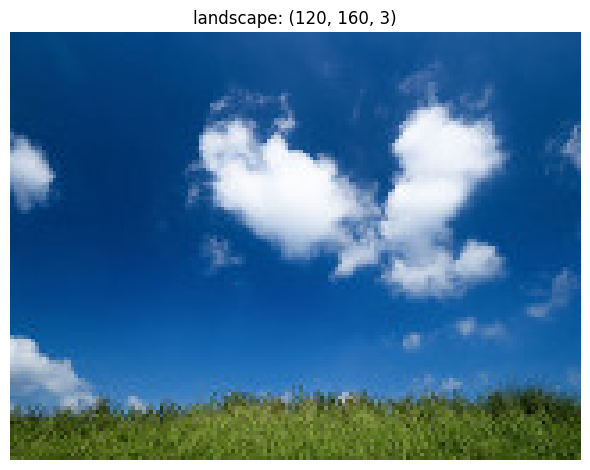

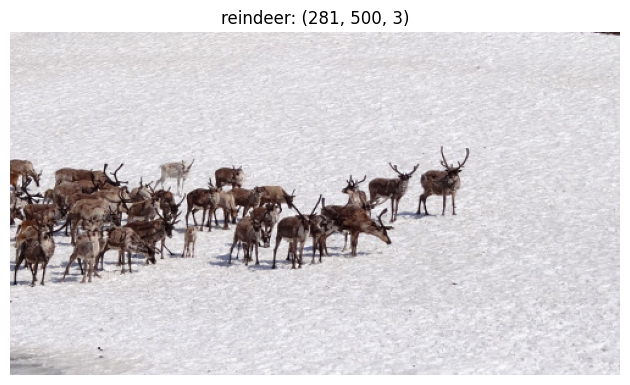

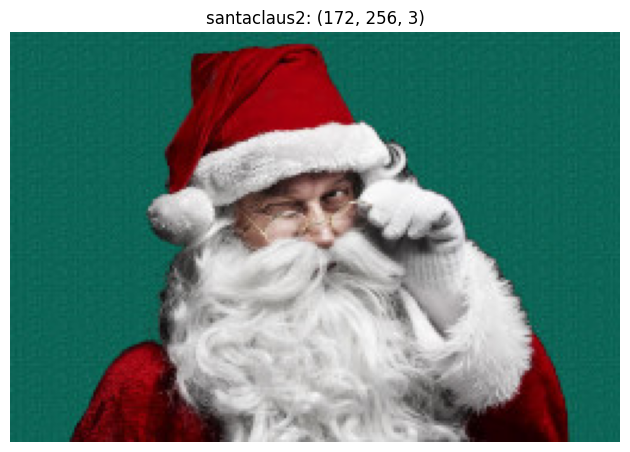

In [8]:
# To load the images use the function plt.imread(<path_to_iamge>)
titles = ["landscape", "reindeer", "santaclaus2"]
path = ["./data/" + t + ".jpg" for t in titles]
images = [plt.imread(p) for p in path]

# Plot the images with their shapes
# Sugestion: use the function img_plot()
for t,img in zip(titles, images):
    img_plot(img, t)

We are going to start by using the Santa Claus image.


In [9]:
# Reshape the data to a matrix of num_pixels x 3
santa_origin = images[2]
santa = santa_origin.reshape(santa_origin.shape[0]*santa_origin.shape[1], 3)

# (divide by 255 to have colors in [0 1] range for plotting functions of sklearn)
santa=santa/255
# Print the shape of the data and the min and max values of the pixels
print("Shape: ", santa.shape)
print("(min, max): ", (np.min(santa), np.max(santa)))

Shape:  (44032, 3)
(min, max):  (0.0, 1.0)


Plot the points in the 3-dimensional space with normalized intervals between 0 and 1 (corresponding to the three channels of the image, i.e. Red Green and Blue)

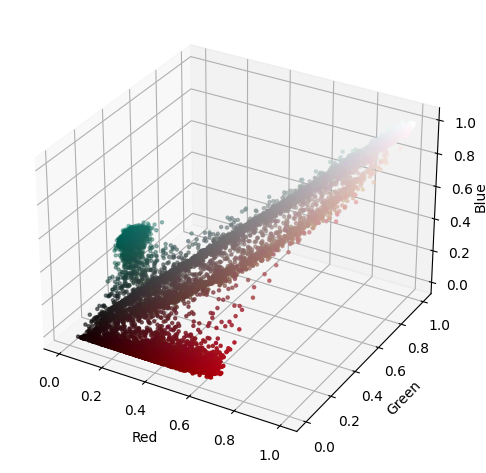

In [10]:
# Sugestion: use the function scatter_plot()
scatter_plot(santa)

### TO DO (A.1)
Implement the k-means algorithm manually (**do not use the kmeans function of sklearn and do not download implementations from other web sources**). The inputs to the function is the set of vectors to be clustered and the number of clusters. The output must contain the clusters barycenters, a vector associating each data point to the corresponding cluster and the error (value of the cost function) at each iteration.
Additionally, fix a maximum number of iterations of the k-means algorithm (e.g., 50).

Be careful about the initalization, you can use some random points from the training set, or get random values but ensure they are in the proper range. Poor initalizations can lead to the failure of the algorithm (in particular check that no cluster is initialized as empty, otherwise the algorithm can not update it).

In [11]:
def d(X: np.array, Y: np.array):
    return (np.dot(X-Y, X-Y))

def my_kmeans(points: np.ndarray, k: int, max_iters: int = 50) -> tp.Tuple[np.ndarray, np.ndarray, list]:
    """
    Perform K-means clustering
    :param points: data points
    :param k: number of clusters
    :param max_iters: maximum number of iterations
    """

    # Generate random centers
    # use sigma and mean to ensure it represent the whole data
    centroids = list()
    while(True):
        directions = np.random.rand(k, points.shape[1])
        centroids = np.array([np.mean(points, axis = 0) + np.std(points, axis = 0)*v/np.linalg.norm(v) for v in directions])
        #checking that the initial clusters are not empty
        distances = np.array([[d(p, c) for c in centroids] for p in points])
        clusters = np.array([np.argmin(distances[i]) for i,_ in enumerate(points)])
        if(len(np.unique(clusters)) == k): 
            break
    
    prev_error = 100000
    error = [9999]
    
    # Iterate until the estimate of that center stays the same or max iteration are reached
    iters = 0
    while (error[iters] != prev_error) and iters < max_iters:
        # Measure the distance to every center
        distances = np.array([[d(p, c) for c in centroids] for p in points])
        clusters = np.array([np.argmin(distances[i]) for i,_ in enumerate(points)])

        # Calculate mean for every cluster and update the center
        centroids = np.array([np.mean(points[clusters==i], axis=0) for i in range(k)])
        
        # Update the error
        prev_error=error[iters]
        error.append(sum([d(p, c) for i, c in enumerate(centroids) for p in points[clusters==i]]))
        
        # Update the iteration counter
        iters += 1
    return centroids, clusters, error

### TO DO (A.2)

Now try the function you developed on the Santaclaus image with three clusters (k=3). 

Then plot the data points in the 3-dimensional space, each point must be coloured based on the membership to one of the clusters. Additionally, plot the respective clusters centroids (use a different shape, size or color to highlight the centroids).

Last error:  1092.8765497481209


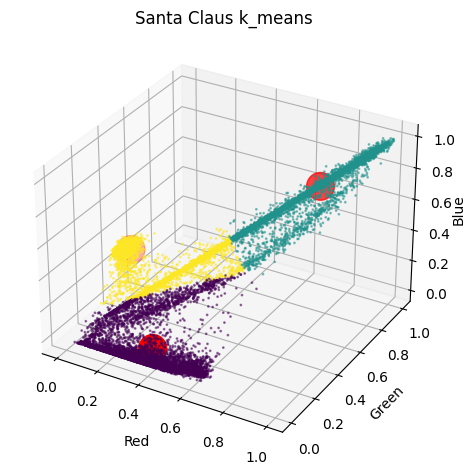

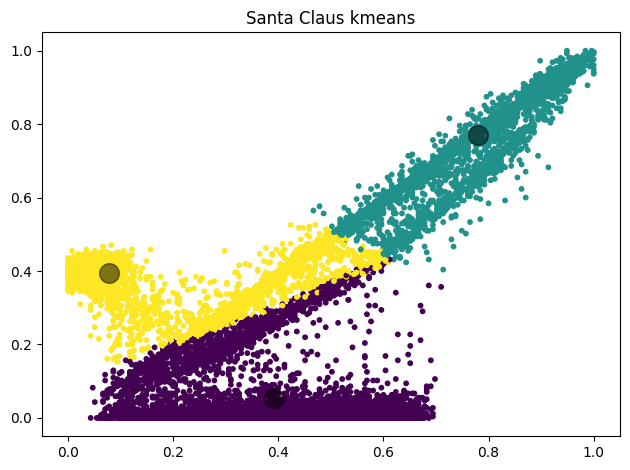

In [12]:
# Run your K-means function on the data
centroids, clusters, error = my_kmeans(santa, 3)

# Print the errors:
print("Last error: ", error[-1])

# Plot the results
scatter_plot(santa, clusters, centroids, title='Santa Claus k_means')
scatter_plot_2d(santa, clusters, centroids, title='Santa Claus kmeans')

### TO DO (A.3) 
Plot the value of the error versus the number of iterations

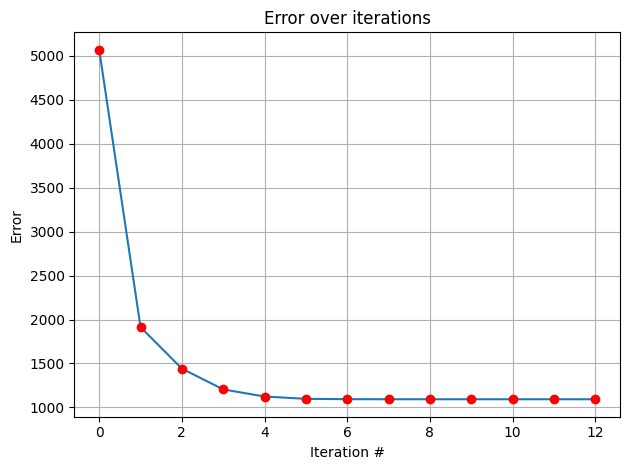

In [13]:
# Sugestion: use the function error_plot()
error_plot(error)

### TO DO (A.4)
Now use the k-means function provided in sklearn. Pass to the function the number of clusters and use multiple random initializations (n_init parameter). Go to the documentation page for further details

In [14]:
# Define the K-means model
skmeans = KMeans(n_clusters=3, init="random", n_init=10, max_iter=50, algorithm="lloyd")

# Fit the model to the data
skmeans = skmeans.fit(santa)

# Get the cluster centers
sk_centroids = skmeans.cluster_centers_
sk_clusters = skmeans.labels_
print(1-skmeans.score(santa))

1093.8795229927582


Perform the same plot as above but with the output of the k-means function provided in sklearn.

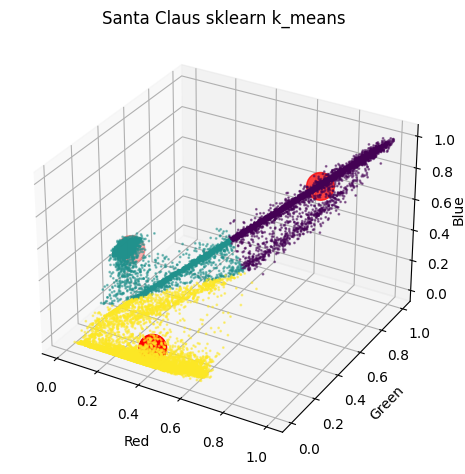

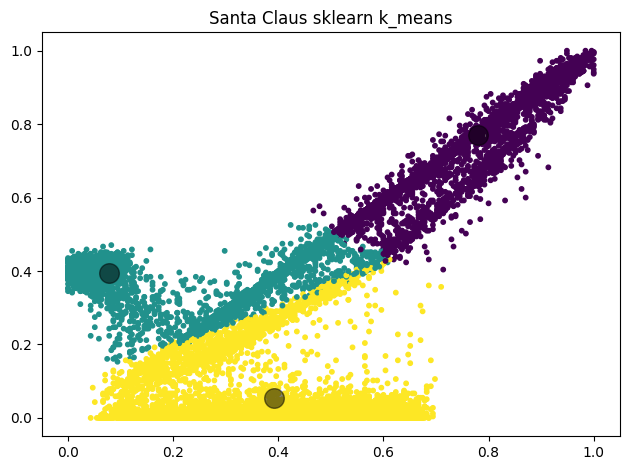

In [15]:
scatter_plot(santa, sk_clusters, sk_centroids, title='Santa Claus sklearn k_means')
scatter_plot_2d(santa, sk_clusters, sk_centroids, title='Santa Claus sklearn k_means')

### TO DO (A.Q1) [Answare the following] 

Compare the results obtained with your implementation and with k-means from sklearn. Do you observe any differences, *i.e.*, do the two plots match?

The two plots are barely the same. 
I noticed that the algorithm provides more consistent results initializing the centroids closer to the "centre of mass" of the dataset. So smaller multiples of the standard deviation must be preferred. 
The main difference is the execution time, because my implementation is not so optimized. 

### TO DO (A.5)

Now display the segmented image based on the two clusters found above with the k-means functions by sklearn.

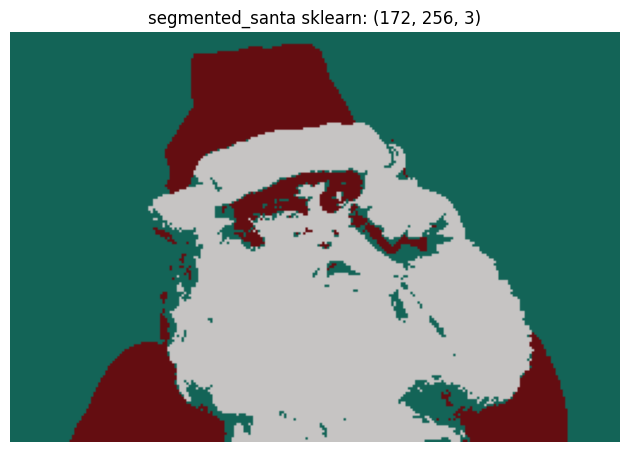

In [16]:
# Extract the color values of the centers
sk_colors = sk_centroids*255
sk_segmented_santa = np.array([sk_colors[c] for c in sk_clusters], dtype="int")

# Reshape the data to the original image shape
sk_segmented_santa = sk_segmented_santa.reshape(santa_origin.shape[0],santa_origin.shape[1], 3)

# Plot the recolored image
img_plot(sk_segmented_santa, "segmented_santa sklearn")

Now display the segmented image based on the two clusters found above with the k-means functions implemented by yourselves.

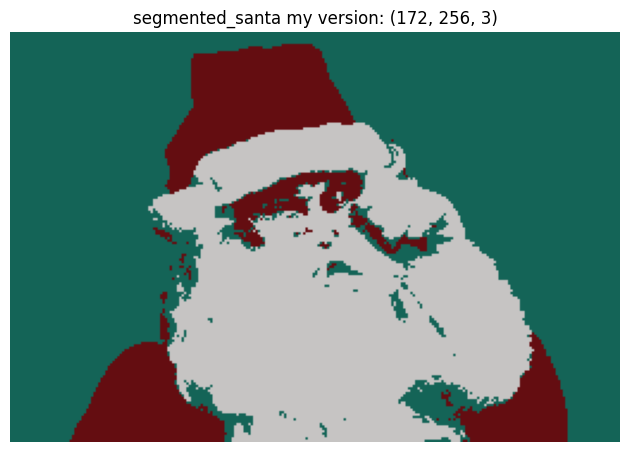

In [17]:
# Extract the color values of the centers
colors = centroids*255
segmented_santa = np.array([colors[c] for c in clusters], dtype="int")

# Reshape the data to the original image shape
segmented_santa = segmented_santa.reshape(santa_origin.shape[0],santa_origin.shape[1], 3)

# Plot the recolored image
img_plot(segmented_santa, "segmented_santa my version")

### TO DO (A.Q2) [Answare the following]

What do you observe? Do you think clustering is useful for image segmenation? And for image compression? Comment your answer.

Again with my implementation and the sklear one I've obtained consistent results.

I think that clustering is useful for image segmentation when the object we're interested in is roughly characterized by the same color. Furthermore, that color must be different from the surrounding neighborhood (for example, this technique will probably fail if we want to segment a colorful dress, a parrot, or a polar bear on the snow in a single block).

On the other hand, it's useful for lossy image compression because it can be used to identify and replace similar colors. Then it's possible to encode those fewer colors in a more efficient way than RGB and store the compressed image. The obvious downside is that with this technique, we're also reducing the quality of the image.

### TO DO (A.6)

Now load the landscape image (optional: try also with the reindeer image) and segment it using kmeans with k varying from 2 to 15 clusters. You can use the sklearn implementation.

Then plot the resulting data points in the 3-dimensional space, each point must be colored based on the cluster membership.

Shape:  (140500, 3)
(min, max):  (0.0, 1.0)

K-means clustering with different values of K (2-15):


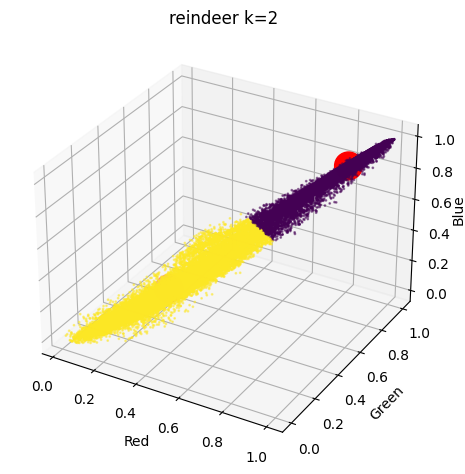

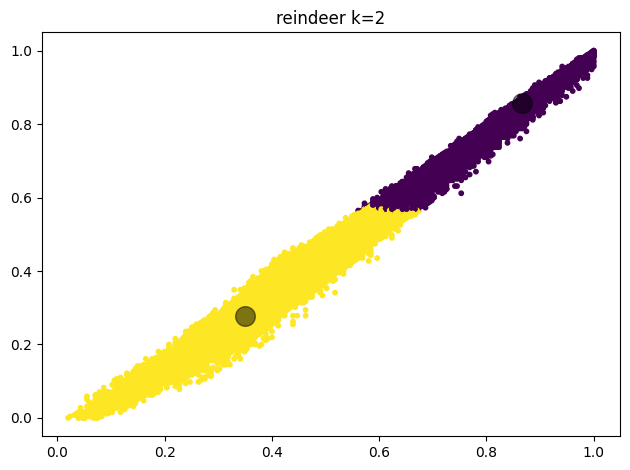

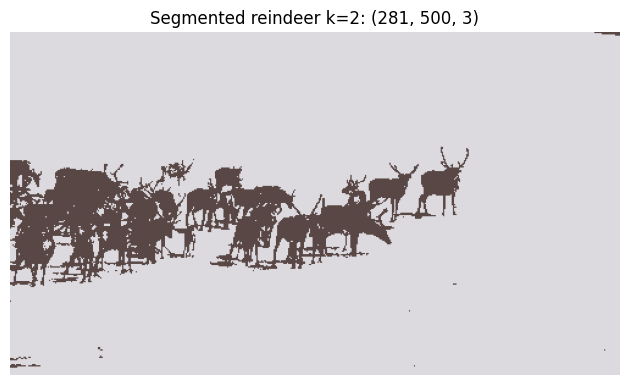

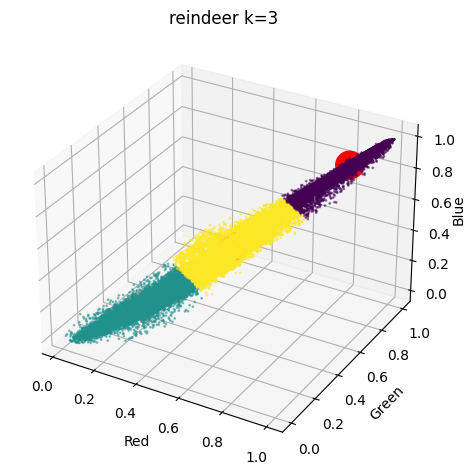

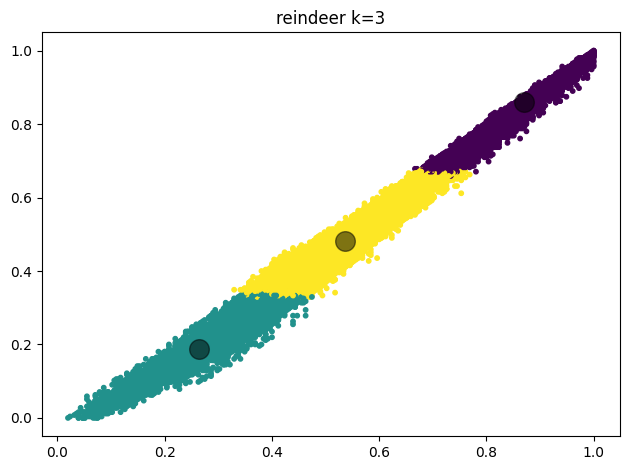

...

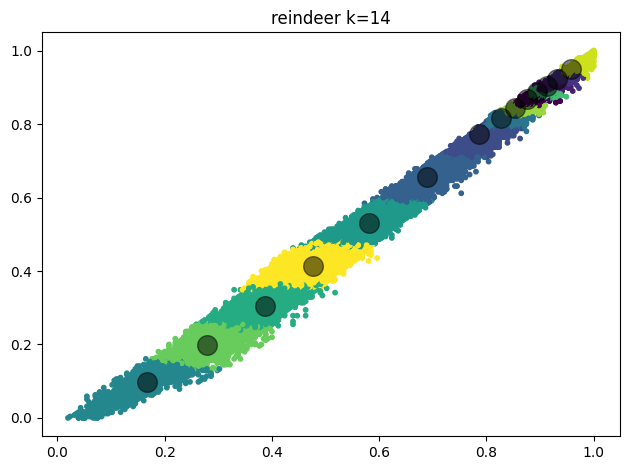

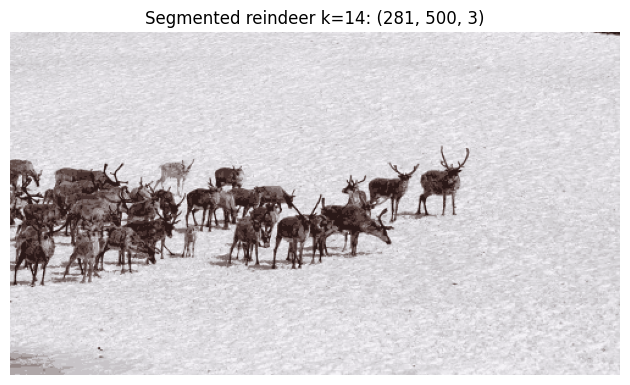

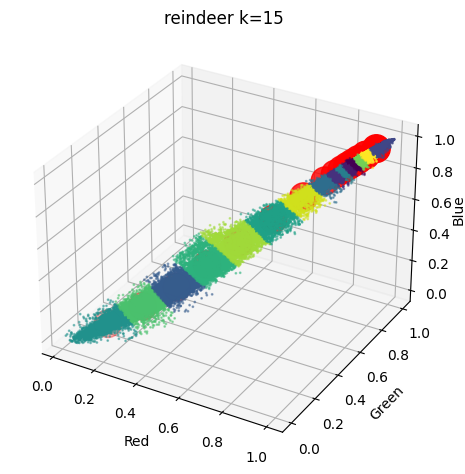

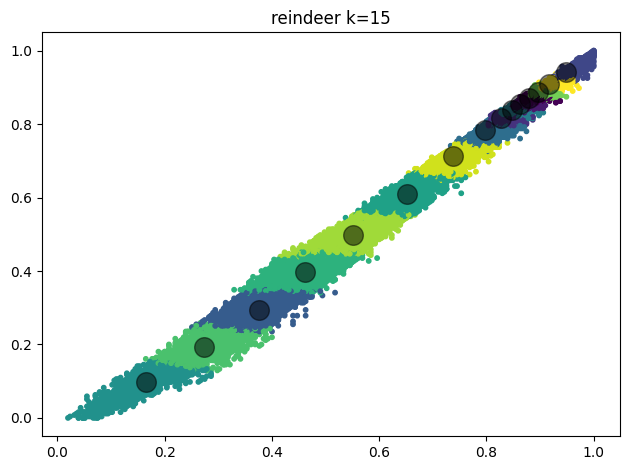

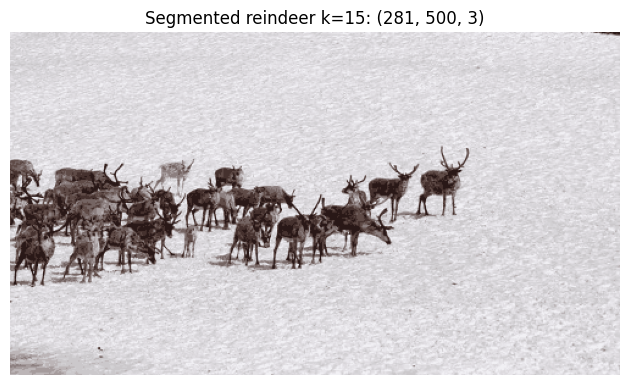

Shape:  (19200, 3)
(min, max):  (0.0, 1.0)

K-means clustering with different values of K (2-15):


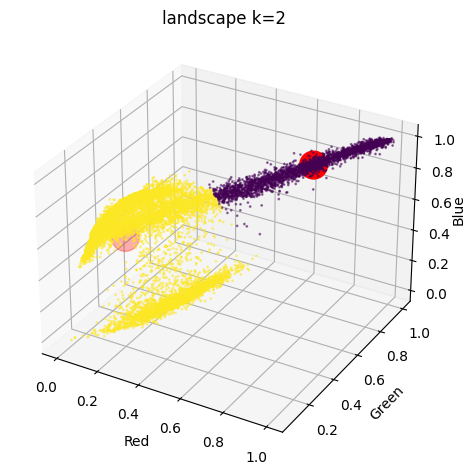

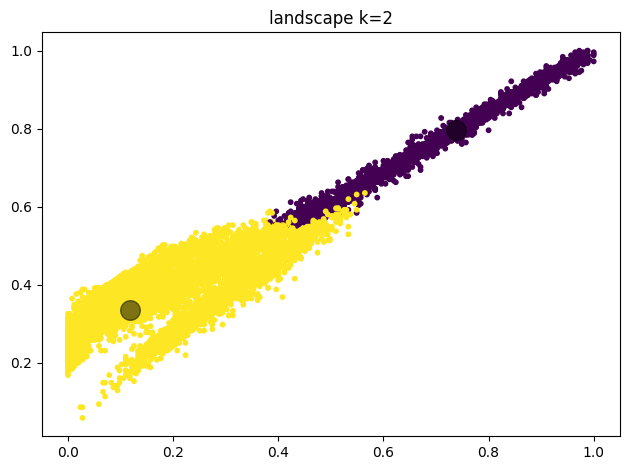

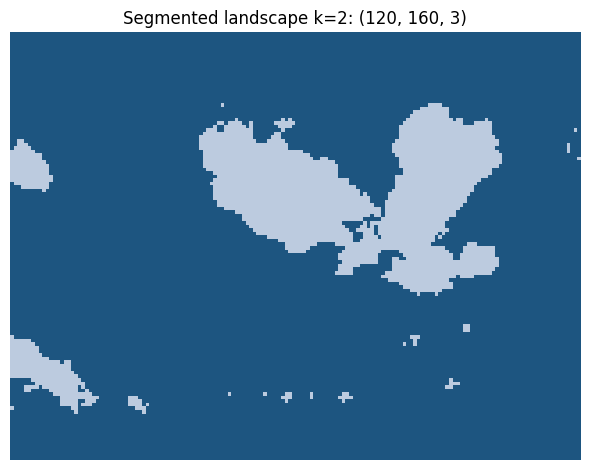

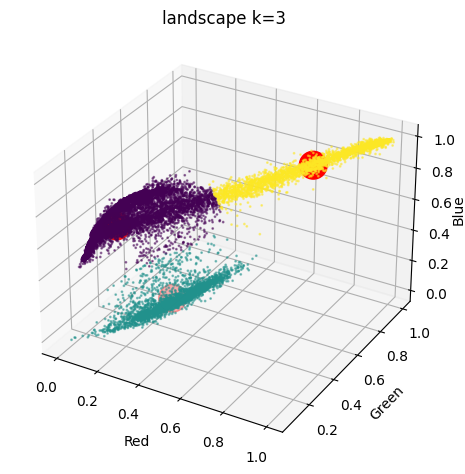

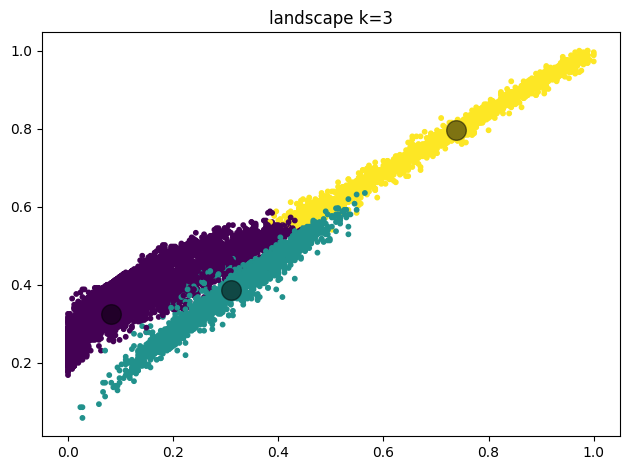

...

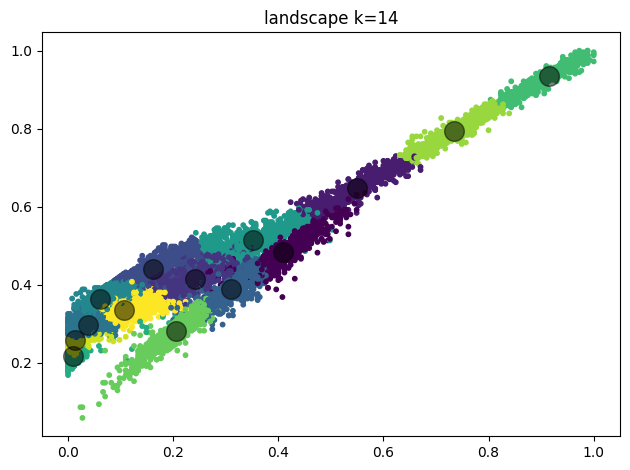

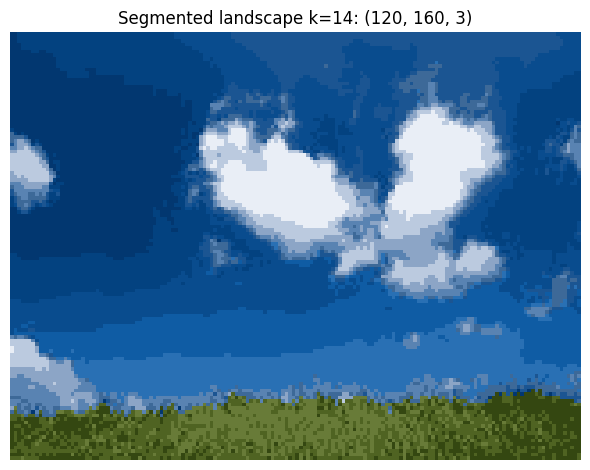

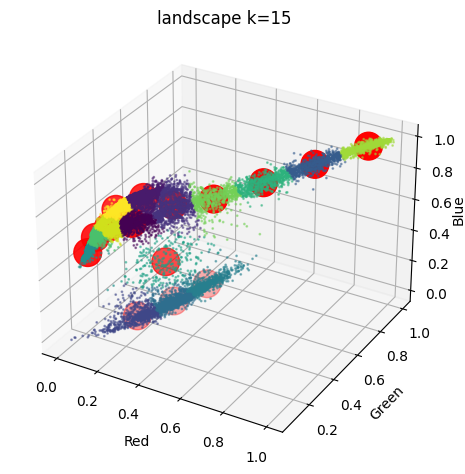

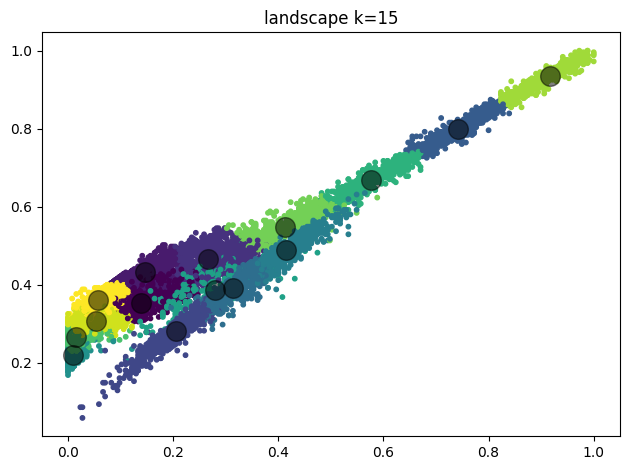

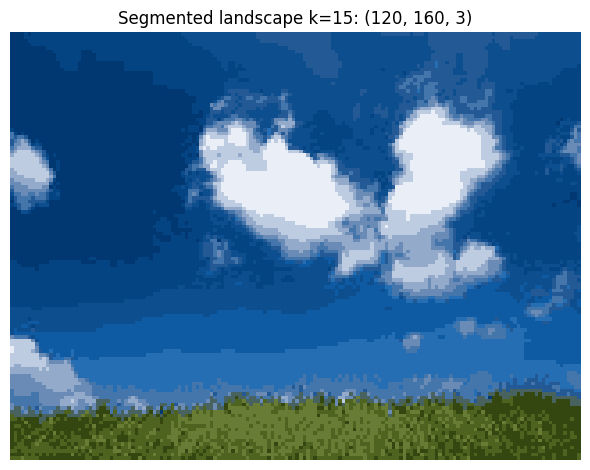

In [18]:
inertia = list()
for im in reversed(range(2)):
    # Reshape the data to a matrix of num_pixels x 3
    land_origin = images[im]

    land = land_origin.reshape(land_origin.shape[0]*land_origin.shape[1], 3)

    # (divide by 255 to have colors in [0 1] range for plotting functions of sklearn)
    land=land/255
    # Print the shape of the data and the min and max values of the pixels
    print("Shape: ", land.shape)
    print("(min, max): ", (np.min(land), np.max(land)))


    # Cycle over different values of K and plot the results for each value
    print('\nK-means clustering with different values of K (2-15):')
    inertia = list()
    for k in range(2,16):
        # Define the K-means model
        skmeans = KMeans(n_clusters=k, init="random", n_init=10, max_iter=50, algorithm="lloyd")

        # Fit the model to the data
        skmeans = skmeans.fit(land)

        # Get the cluster centers
        sk_centroids = skmeans.cluster_centers_
        sk_clusters = skmeans.labels_
        
        # Extarct the color values of the centers
        colors = sk_centroids*255
        sk_segmented_land = np.array([colors[c] for c in sk_clusters], dtype="int")

        # Reshape the data to the original image shape
        sk_segmented_land = sk_segmented_land.reshape(land_origin.shape[0], land_origin.shape[1], 3)

        # Update the inertia
        inertia.append(skmeans.inertia_)
        
        # Plot the scatter plot and the ricolored imag
        scatter_plot(land, sk_clusters, sk_centroids, title= titles[im] + ' k='+str(k))
        scatter_plot_2d(land, sk_clusters, sk_centroids, title=titles[im] + ' k='+str(k))

        # Plot the recolored image
        img_plot(sk_segmented_land, title='Segmented ' + titles[im] + ' k='+str(k))



### TO DO (A.7)

Plot for different values of k (e.g. k between 2 and 15) the respective error of the kmeans algorithm 

Text(0.5, 1.0, 'K vs Error')

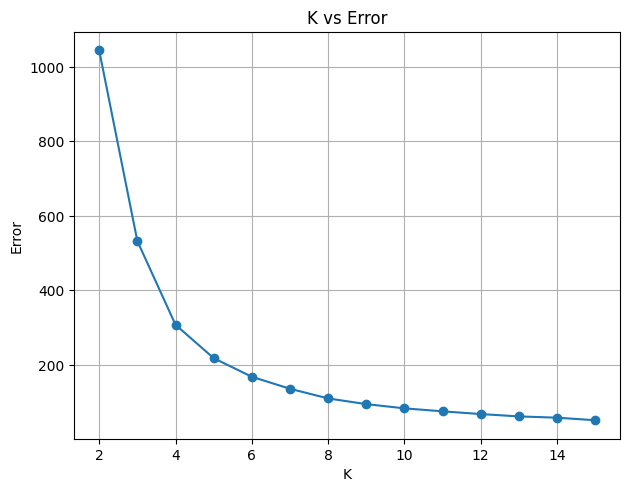

In [19]:
plt.plot(range(2,16), inertia, 'o', linestyle="-")
plt.xlabel("K")
plt.ylabel("Error")
plt.grid()
plt.tight_layout()
plt.title("K vs Error")

### TO DO (AQ.3) [Answare the following]

Compare the results with different values of k, what do you observe? 

Analyze also the error, which one do you think is the optimal value of k?

Is there a single, clear answer?

With the increasing in the value of K we are obtaining images with more and more colors and details. 
In both cases I can notice a certain tendence of the clusters to accumulate in the same specific region.

Talking about the error, it decreses as k increases but with at a slower and slower rate. 
There isn't an optimal value, it depends on the specific image and in what we're interested in.

---

## B) Linkage-based clustering

The second part of the assignment concern instead linkage-based clustering. We will use the AgglomerativeClustering module of sklearn. 

### TO DO (B.0)

Load the sample dataset located at `data/moon_data.npz`

In [20]:
import zipfile

def read_metadata(file_name):
    zip_file=zipfile.ZipFile(file_name, mode='r')
    arr_names=zip_file.namelist()

    metadata=[]
    for arr_name in arr_names:
        fp=zip_file.open(arr_name,"r")
        version=np.lib.format.read_magic(fp)

        if version[0]==1:
            shape,fortran_order,dtype=np.lib.format.read_array_header_1_0(fp)
        elif version[0]==2:
            shape,fortran_order,dtype=np.lib.format.read_array_header_2_0(fp)
        else:
            print("File format not detected!")
        metadata.append((arr_name,shape,fortran_order,dtype))
        fp.close()
    zip_file.close()
    return metadata

print(read_metadata('./data/moon_data.npz'))
# Load sample data
data = np.load("./data/moon_data.npz")

# Extract data
x = data['X']
labels_true = data['labels_true']
print(labels_true)

[('X.npy', (1500, 2), False, dtype('float64')), ('labels_true.npy', (1500,), False, dtype('int64'))]
[1 0 1 ... 1 0 1]


### TO DO (B.1)

Now exploit the AgglomerativeClustering algorithm from sklearn on the provided sample data points. Use the "single" linkage type that correspond to the minimum distance criteria seen in the lectures and 2 clusters. Notice that the "single" option has been introduced recently in sklearn, if you get an error ensure you have a recent version of the library. Plot the resulting clustering.

In [21]:
# Compute Agglomerative Clustering
# Define the Agglomerative Clustering model
clustering = AgglomerativeClustering(n_clusters=2, linkage="single")

# Fit the model to the data
clustering = clustering.fit(x)

# Compute the number of clusters in labels, ignoring noise if present.
n_cluster = clustering.n_clusters_
labels = clustering.labels_

# Print the results
print("n_cluster: ", n_cluster)
print("Labels: ", labels)
print("Missclassified samples: ", min(sum(labels!=labels_true), sum(labels==labels_true)))

n_cluster:  2
Labels:  [1 0 1 ... 1 0 1]
Missclassified samples:  0


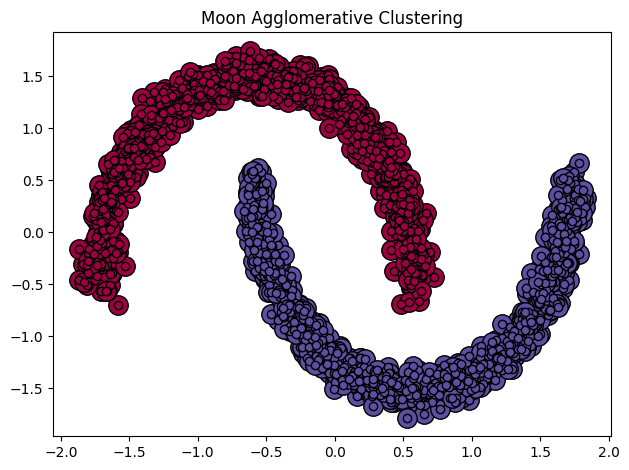

In [22]:
# Plot result 
cluster_plot(labels, x, "Moon Agglomerative Clustering")


### TO DO (B.2)

Now try the KMeans with two clusters on the same dataset we used for the AgglomerativeClustering algorithm.

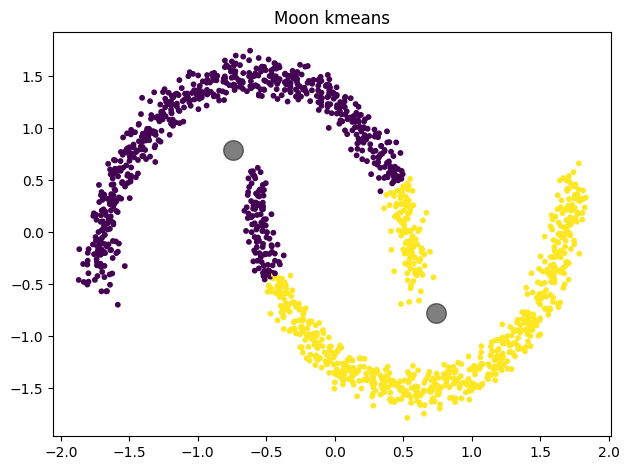

Inertia  1248.3580216223236
Missclassified samples:  232


In [23]:
# Define the K-means model
skmeans = KMeans(n_clusters=2, init="random", n_init=10, max_iter=50, algorithm="lloyd")

# Fit the model to the data
skmeans = skmeans.fit(x)

# Get the cluster centers
sk_centroids = skmeans.cluster_centers_
sk_clusters = skmeans.labels_

# Plot the results
scatter_plot_2d(x, sk_clusters, sk_centroids, title="Moon kmeans")
print("Inertia ", skmeans.inertia_)
print("Missclassified samples: ", min(sum(sk_clusters!=labels_true), sum(sk_clusters==labels_true)))

### TO DO (B.Q1) [Answare the following]

Compare the results of K-means and Agglomerative Clustering and explain what you observe and why?

**ANSWER B.Q1:** 
Agglomerative Clustering performs better in this case compared to K-means, as it can accurately capture the complex shape of the cluster.

In fact, the K-means algorithm classifies points in feature space by assigning them to the closest cluster centroids. The disadvantage of this procedure is that it may encounter difficulties in capturing clusters with a very "elongated shape" close to others in space, as is the case here.

On the other hand, Agglomerative clustering, with its "local" construction procedure, gradually grows by agglomerating closer clusters with one another, and this approach works perfectly in such scenarios as it makes no prior assumptions about cluster shapes.

---